Reference Dataset:
[IAM Dataset](https://fki.tic.heia-fr.ch/databases/iam-handwriting-database)


# Get Data

In [1]:
!wget -q https://git.io/J0fjL -O IAM_Words.zip 
!unzip -qq IAM_Words.zip 

!mkdir data 
!mkdir data/words 
!tar -xf IAM_Words/words.tgz -C data/words 
!mv IAM_Words/words.txt data

replace IAM_Words/words.tgz? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C
mkdir: data: File exists
mkdir: data/words: File exists
mv: IAM_Words/words.txt: No such file or directory


In [8]:
!head -20 data/words.txt

#--- words.txt ---------------------------------------------------------------#
#
# iam database word information
#
# format: a01-000u-00-00 ok 154 1 408 768 27 51 AT A
#
#     a01-000u-00-00  -> word id for line 00 in form a01-000u
#     ok              -> result of word segmentation
#                            ok: word was correctly
#                            er: segmentation of word can be bad
#
#     154             -> graylevel to binarize the line containing this word
#     1               -> number of components for this word
#     408 768 27 51   -> bounding box around this word in x,y,w,h format
#     AT              -> the grammatical tag for this word, see the
#                        file tagset.txt for an explanation
#     A               -> the transcription for this word
#
a01-000u-00-00 ok 154 408 768 27 51 AT A
a01-000u-00-01 ok 154 507 766 213 48 NN MOVE


# Setup

In [1]:
from tensorflow.keras.layers.experimental.preprocessing import StringLookup
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import os

np.random.seed(42)
tf.random.set_seed(42)

# Data Spliting

In [2]:
base_path = "data"
words_list = []

words = open(f"{base_path}/words.txt", "r").readlines()
for line in words:
    if line[0] == "#":
        continue
    if line.split(" ")[1] != "err":  # We don't need to deal with errored entries.
        words_list.append(line)

len(words_list)

np.random.shuffle(words_list)

split_idx = int(0.9 * len(words_list))
train_samples = words_list[:split_idx]
test_samples = words_list[split_idx:]

val_split_idx = int(0.5 * len(test_samples))
validation_samples = test_samples[:val_split_idx]
test_samples = test_samples[val_split_idx:]

assert len(words_list) == len(train_samples) + len(validation_samples) + len(
    test_samples
)

print(f"Total training samples: {len(train_samples)}")
print(f"Total validation samples: {len(validation_samples)}")
print(f"Total test samples: {len(test_samples)}")

Total training samples: 86810
Total validation samples: 4823
Total test samples: 4823



## Data input pipeline

We start building our data input pipeline by first preparing the image paths.

In [3]:
base_image_path = os.path.join(base_path, "words")


def get_image_paths_and_labels(samples):
    paths = []
    corrected_samples = []
    for (i, file_line) in enumerate(samples):
        line_split = file_line.strip()
        line_split = line_split.split(" ")

        # Each line split will have this format for the corresponding image:
        # part1/part1-part2/part1-part2-part3.png
        image_name = line_split[0]
        partI = image_name.split("-")[0]
        partII = image_name.split("-")[1]
        img_path = os.path.join(
            base_image_path, partI, partI + "-" + partII, image_name + ".png"
        )
        if os.path.getsize(img_path):
            paths.append(img_path)
            corrected_samples.append(file_line.split("\n")[0])

    return paths, corrected_samples


train_img_paths, train_labels = get_image_paths_and_labels(train_samples)
validation_img_paths, validation_labels = get_image_paths_and_labels(validation_samples)
test_img_paths, test_labels = get_image_paths_and_labels(test_samples)

"""
Then we prepare the ground-truth labels.
"""

# Find maximum length and the size of the vocabulary in the training data.
train_labels_cleaned = []
characters = set()
max_len = 0

for label in train_labels:
    label = label.split(" ")[-1].strip()
    for char in label:
        characters.add(char)

    max_len = max(max_len, len(label))
    train_labels_cleaned.append(label)

characters = sorted(list(characters))

print("Maximum length: ", max_len)
print("Vocab size: ", len(characters))

# Check some label samples.
train_labels_cleaned[:10]

Maximum length:  21
Vocab size:  78


['sure',
 'he',
 'during',
 'of',
 'booty',
 'gastronomy',
 'boy',
 'The',
 'and',
 'in']

In [4]:
"""
Now we clean the validation and the test labels as well.
"""
def clean_labels(labels):
    cleaned_labels = []
    for label in labels:
        label = label.split(" ")[-1].strip()
        cleaned_labels.append(label)
    return cleaned_labels


validation_labels_cleaned = clean_labels(validation_labels)
test_labels_cleaned = clean_labels(test_labels)

In [5]:
"""
### Building the character vocabulary

Keras provides different preprocessing layers to deal with different modalities of data.
[This guide](https://keras.io/guides/preprocessing_layers/) provides a comprehensive introduction.
Our example involves preprocessing labels at the character
level. This means that if there are two labels, e.g. "cat" and "dog", then our character
vocabulary should be {a, c, d, g, o, t} (without any special tokens). We use the
[`StringLookup`](https://keras.io/api/layers/preprocessing_layers/categorical/string_lookup/)
layer for this purpose.
"""


AUTOTUNE = tf.data.AUTOTUNE

# Mapping characters to integers.
char_to_num = StringLookup(vocabulary=list(characters), mask_token=None)

# Mapping integers back to original characters.
num_to_char = StringLookup(
    vocabulary=char_to_num.get_vocabulary(), mask_token=None, invert=True
)


Metal device set to: Apple M2


2022-10-11 07:55:43.391117: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-10-11 07:55:43.391452: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [6]:
"""
### Resizing images without distortion

Instead of square images, many OCR models work with rectangular images. This will become
clearer in a moment when we will visualize a few samples from the dataset. While
aspect-unaware resizing square images does not introduce a significant amount of
distortion this is not the case for rectangular images. But resizing images to a uniform
size is a requirement for mini-batching. So we need to perform our resizing such that
the following criteria are met:

* Aspect ratio is preserved.
* Content of the images is not affected.
"""


def distortion_free_resize(image, img_size):
    w, h = img_size
    image = tf.image.resize(image, size=(h, w), preserve_aspect_ratio=True)

    # Check tha amount of padding needed to be done.
    pad_height = h - tf.shape(image)[0]
    pad_width = w - tf.shape(image)[1]

    # Only necessary if you want to do same amount of padding on both sides.
    if pad_height % 2 != 0:
        height = pad_height // 2
        pad_height_top = height + 1
        pad_height_bottom = height
    else:
        pad_height_top = pad_height_bottom = pad_height // 2

    if pad_width % 2 != 0:
        width = pad_width // 2
        pad_width_left = width + 1
        pad_width_right = width
    else:
        pad_width_left = pad_width_right = pad_width // 2

    image = tf.pad(
        image,
        paddings=[
            [pad_height_top, pad_height_bottom],
            [pad_width_left, pad_width_right],
            [0, 0],
        ],
    )

    image = tf.transpose(image, perm=[1, 0, 2])
    image = tf.image.flip_left_right(image)
    return image


If we just go with the plain resizing then the images would look like so:

![](https://i.imgur.com/eqq3s4N.png)

Notice how this resizing would have introduced unnecessary stretching.

In [7]:
"""
### Putting the utilities together
"""

batch_size = 64
padding_token = 99
image_width = 128
image_height = 32


def preprocess_image(image_path, img_size=(image_width, image_height)):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, 1)
    image = distortion_free_resize(image, img_size)
    image = tf.cast(image, tf.float32) / 255.0
    return image


def vectorize_label(label):
    label = char_to_num(tf.strings.unicode_split(label, input_encoding="UTF-8"))
    length = tf.shape(label)[0]
    pad_amount = max_len - length
    label = tf.pad(label, paddings=[[0, pad_amount]], constant_values=padding_token)
    return label


def process_images_labels(image_path, label):
    image = preprocess_image(image_path)
    label = vectorize_label(label)
    return {"image": image, "label": label}


def prepare_dataset(image_paths, labels):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels)).map(
        process_images_labels, num_parallel_calls=AUTOTUNE
    )
    return dataset.batch(batch_size).cache().prefetch(AUTOTUNE)



In [8]:
"""
## Prepare `tf.data.Dataset` objects
"""

train_ds = prepare_dataset(train_img_paths, train_labels_cleaned)
validation_ds = prepare_dataset(validation_img_paths, validation_labels_cleaned)
test_ds = prepare_dataset(test_img_paths, test_labels_cleaned)


2022-10-11 07:55:43.867938: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-10-11 07:55:44.057024: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


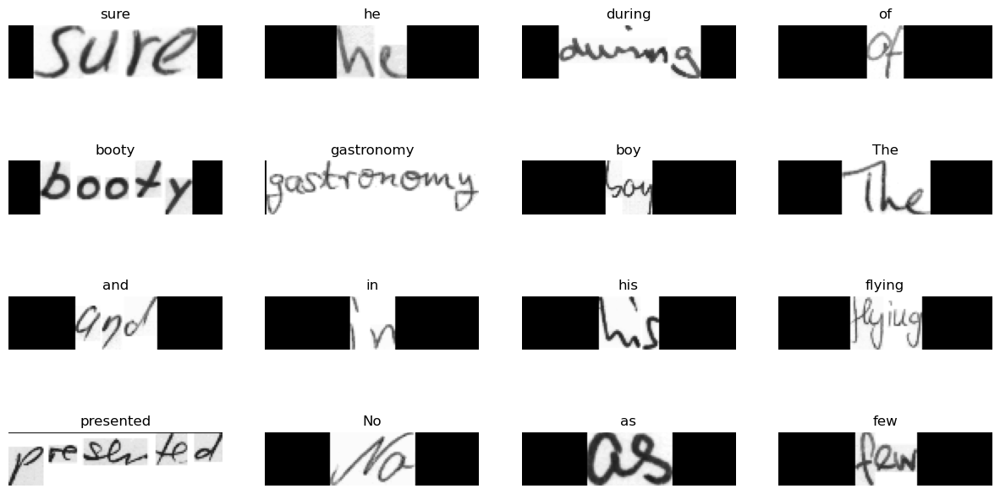

In [9]:
"""
## Visualize a few samples
"""

for data in train_ds.take(1):
    images, labels = data["image"], data["label"]

    _, ax = plt.subplots(4, 4, figsize=(15, 8))

    for i in range(16):
        img = images[i]
        img = tf.image.flip_left_right(img)
        img = tf.transpose(img, perm=[1, 0, 2])
        img = (img * 255.0).numpy().clip(0, 255).astype(np.uint8)
        img = img[:, :, 0]

        # Gather indices where label!= padding_token.
        label = labels[i]
        indices = tf.gather(label, tf.where(tf.math.not_equal(label, padding_token)))
        # Convert to string.
        label = tf.strings.reduce_join(num_to_char(indices))
        label = label.numpy().decode("utf-8")

        ax[i // 4, i % 4].imshow(img, cmap="gray")
        ax[i // 4, i % 4].set_title(label)
        ax[i // 4, i % 4].axis("off")


plt.show()

## Model

Our model will use the CTC loss as an endpoint layer. For a detailed understanding of the
CTC loss, refer to [this post](https://distill.pub/2017/ctc/).

In [10]:
class CTCLayer(keras.layers.Layer):
    def __init__(self, name=None):
        super().__init__(name=name)
        self.loss_fn = keras.backend.ctc_batch_cost

    def call(self, y_true, y_pred):
        batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
        input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
        label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")

        input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        loss = self.loss_fn(y_true, y_pred, input_length, label_length)
        self.add_loss(loss)

        # At test time, just return the computed predictions.
        return y_pred


def build_model():
    # Inputs to the model
    input_img = keras.Input(shape=(image_width, image_height, 1), name="image")
    labels = keras.layers.Input(name="label", shape=(None,))

    # First conv block.
    x = keras.layers.Conv2D(
        32,
        (3, 3),
        activation="relu",
        kernel_initializer="he_normal",
        padding="same",
        name="Conv1",
    )(input_img)
    x = keras.layers.MaxPooling2D((2, 2), name="pool1")(x)

    # Second conv block.
    x = keras.layers.Conv2D(
        64,
        (3, 3),
        activation="relu",
        kernel_initializer="he_normal",
        padding="same",
        name="Conv2",
    )(x)
    x = keras.layers.MaxPooling2D((2, 2), name="pool2")(x)

    # We have used two max pool with pool size and strides 2.
    # Hence, downsampled feature maps are 4x smaller. The number of
    # filters in the last layer is 64. Reshape accordingly before
    # passing the output to the RNN part of the model.
    new_shape = ((image_width // 4), (image_height // 4) * 64)
    
    x = keras.layers.Reshape(target_shape=new_shape, name="reshape")(x)
    x = keras.layers.Dense(64, activation="relu", name="dense1")(x)
    x = keras.layers.Dropout(0.2)(x)

    # RNNs.
#     x = keras.layers.Bidirectional(
#         keras.layers.LSTM(128, return_sequences=True, dropout=0.25)
#     )(x)
#     x = keras.layers.Bidirectional(
#         keras.layers.LSTM(64, return_sequences=True, dropout=0.25)
#     )(x)

    # +2 is to account for the two special tokens introduced by the CTC loss.
    # The recommendation comes here: https://git.io/J0eXP.
    x = keras.layers.Dense(
        len(char_to_num.get_vocabulary()) + 2, activation="softmax", name="dense2"
    )(x)

    # Add CTC layer for calculating CTC loss at each step.
    output = CTCLayer(name="ctc_loss")(labels, x)

    # Define the model.
    model = keras.models.Model(
        inputs=[input_img, labels], outputs=output, name="handwriting_recognizer"
    )
    # Optimizer.
    opt = keras.optimizers.Adam()
    # Compile the model and return.
    model.compile(optimizer=opt)
    return model


# Get the model.
model = build_model()
model.summary()

Model: "handwriting_recognizer"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 128, 32, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 Conv1 (Conv2D)                 (None, 128, 32, 32)  320         ['image[0][0]']                  
                                                                                                  
 pool1 (MaxPooling2D)           (None, 64, 16, 32)   0           ['Conv1[0][0]']                  
                                                                                                  
 Conv2 (Conv2D)                 (None, 64, 16, 64)   18496       ['pool1[0][0

## Evaluation metric

[Edit Distance](https://en.wikipedia.org/wiki/Edit_distance)
is the most widely used metric for evaluating OCR models. In this section, we will
implement it and use it as a callback to monitor our model.

In [11]:
"""
We first segregate the validation images and their labels for convenience.
"""
validation_images = []
validation_labels = []

for batch in validation_ds:
    validation_images.append(batch["image"])
    validation_labels.append(batch["label"])

"""
Now, we create a callback to monitor the edit distances.
"""


def calculate_edit_distance(labels, predictions):
    # Get a single batch and convert its labels to sparse tensors.
    saprse_labels = tf.cast(tf.sparse.from_dense(labels), dtype=tf.int64)

    # Make predictions and convert them to sparse tensors.
    input_len = np.ones(predictions.shape[0]) * predictions.shape[1]
    predictions_decoded = keras.backend.ctc_decode(
        predictions, input_length=input_len, greedy=True
    )[0][0][:, :max_len]
    sparse_predictions = tf.cast(
        tf.sparse.from_dense(predictions_decoded), dtype=tf.int64
    )

    # Compute individual edit distances and average them out.
    edit_distances = tf.edit_distance(
        sparse_predictions, saprse_labels, normalize=False
    )
    return tf.reduce_mean(edit_distances)


class EditDistanceCallback(keras.callbacks.Callback):
    def __init__(self, pred_model):
        super().__init__()
        self.prediction_model = pred_model

    def on_epoch_end(self, epoch, logs=None):
        edit_distances = []

        for i in range(len(validation_images)):
            labels = validation_labels[i]
            predictions = self.prediction_model.predict(validation_images[i])
            edit_distances.append(calculate_edit_distance(labels, predictions).numpy())

        print(
            f"Mean edit distance for epoch {epoch + 1}: {np.mean(edit_distances):.4f}"
        )


## Training

Now we are ready to kick off model training.

In [12]:
epochs = 20

model = build_model()
prediction_model = keras.models.Model(
    model.get_layer(name="image").input, model.get_layer(name="dense2").output
)
edit_distance_callback = EditDistanceCallback(prediction_model)

# Train the model.
history = model.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=epochs,
    callbacks=[edit_distance_callback],
)

def plot_loss(model, history):
  """Plot the loss after each training epoch."""
  # Convert the history object into a DataFrame.
  history = pd.DataFrame(history.history)

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.plot(range(len(history)), history['loss'], marker='.', color='black')
  plt.plot(range(len(history)), history['val_loss'], marker='.', color='red')
  plt.legend(['train loss', 'validation loss'])
  plt.show()

  # Show the final train loss value and the learned model weights.
  print('Final train loss:', list(history['loss'])[-1])
  print('Final weights:', model.layers[0].get_weights())



Epoch 1/20


2022-10-11 07:55:45.144517: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1357/1357 [==============================] - ETA: 0s - loss: 15.2087

2022-10-11 08:03:00.453066: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2/2 [==============================] - 0s 3ms/step


2022-10-11 08:03:23.038301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 60ms/step
Mean edit distance for epoch 1: 20.9353
1357/1357 [==============================] - 460s 339ms/step - loss: 15.2087 - val_loss: 12.7172
Epoch 2/20


2022-10-11 08:03:25.028784: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 2: 20.7846
1357/1357 [==============================] - 447s 330ms/step - loss: 12.2332 - val_loss: 11.7567
Epoch 3/20
1/1 [==============================] - 0s 13ms/step
Mean edit distance for epoch 3: 20.6832
1357/1357 [==============================] - 454s 335ms/step - loss: 11.3191 - val_loss: 10.8969
Epoch 4/20
1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 4: 20.5801
1357/1357 [==============================] - 457s 336ms/step - loss: 10.6535 - val_loss: 10.1713
Epoch 5/20
1/1 [==============================] - 0s 12ms/step
Mean edit distance for epoch 5: 20.4332
1357/1357 [==============================] - 464s 342ms/step - loss: 10.1230 - val_loss: 9.5087
Epoch 6/20
2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 6: 20.3112
1357/1357 [==============================] - 465s 343ms/step - loss: 9.7267 - val_loss: 9.1458
Epoch 7/20
1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 7: 20.1926
1357/1357 [==============================] - 475s 350ms/step - loss: 9.4240 - val_loss: 8.8448
Epoch 8/20
1/1 [==============================] - 0s 13ms/step
Mean edit distance for epoch 8: 20.1460
1357/1357 [==============================] - 547s 403ms/step - loss: 9.1831 - val_loss: 8.6386
Epoch 9/20
1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 9: 20.1298
1357/1357 [==============================] - 632s 466ms/step - loss: 8.9775 - val_loss: 8.4997
Epoch 10/20
2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 12ms/step
Mean edit distance for epoch 10: 20.1157
1357/1357 [==============================] - 711s 524ms/step - loss: 8.7888 - val_loss: 8.3680
Epoch 11/20
1/1 [==============================] - 0s 12ms/step
Mean edit distance for epoch 11: 20.0425
1357/1357 [==============================] - 498s 367ms/step - loss: 8.6252 - val_loss: 8.2139
Epoch 12/20
1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 12: 19.9844
1357/1357 [==============================] - 501s 369ms/step - loss: 8.4797 - val_loss: 8.0800
Epoch 13/20
1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 13: 19.9081
1357/1357 [==============================] - 509s 375ms/step - loss: 8.3518 - val_loss: 7.9618
Epoch 14/20
2/2 [==============================] - 0s 4ms/step


1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 14: 19.8601
1357/1357 [==============================] - 549s 404ms/step - loss: 8.2377 - val_loss: 7.8569
Epoch 15/20
1/1 [==============================] - 0s 10ms/step
Mean edit distance for epoch 15: 19.8775
1357/1357 [==============================] - 464s 342ms/step - loss: 8.1381 - val_loss: 7.8075
Epoch 16/20
1/1 [==============================] - 0s 10ms/step
Mean edit distance for epoch 16: 19.8571
1357/1357 [==============================] - 446s 329ms/step - loss: 8.0493 - val_loss: 7.7386
Epoch 17/20
1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 17: 19.8405
1357/1357 [==============================] - 446s 328ms/step - loss: 7.9622 - val_loss: 7.6531
Epoch 18/20
2/2 [==============================] - 0s 3ms/step


1/1 [==============================] - 0s 11ms/step
Mean edit distance for epoch 18: 19.8183
1357/1357 [==============================] - 449s 331ms/step - loss: 7.8870 - val_loss: 7.5990
Epoch 19/20
1/1 [==============================] - 0s 12ms/step
Mean edit distance for epoch 19: 19.8023
1357/1357 [==============================] - 451s 332ms/step - loss: 7.8186 - val_loss: 7.5668
Epoch 20/20
1/1 [==============================] - 0s 10ms/step
Mean edit distance for epoch 20: 19.7810
1357/1357 [==============================] - 452s 333ms/step - loss: 7.7572 - val_loss: 7.5035


## Inference

2/2 [==============================] - 0s 5ms/step


/var/folders/8y/pn6zc4td4gqgzdkjr1wqvzs00000gn/T/ipykernel_12103/1991499492.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = plt.subplots(4, 4, figsize=(15, 8))


1/1 [==============================] - 0s 20ms/step


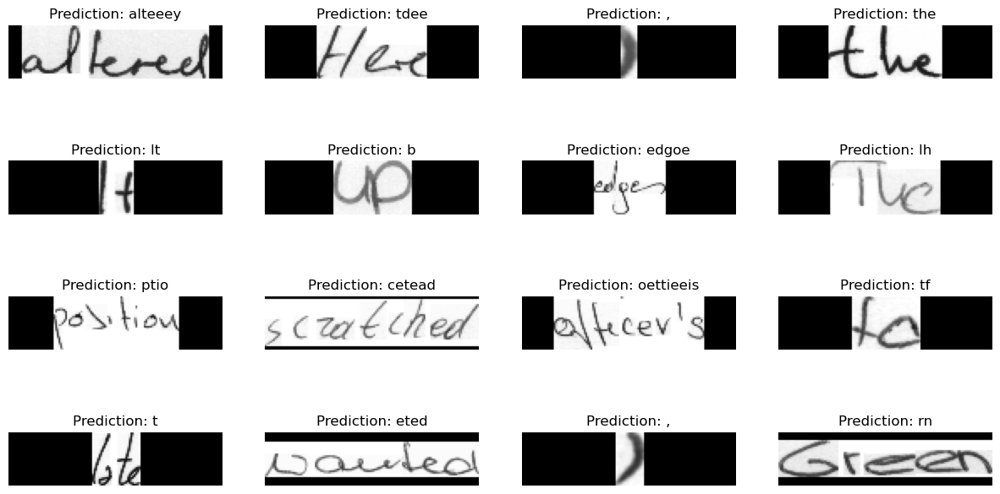

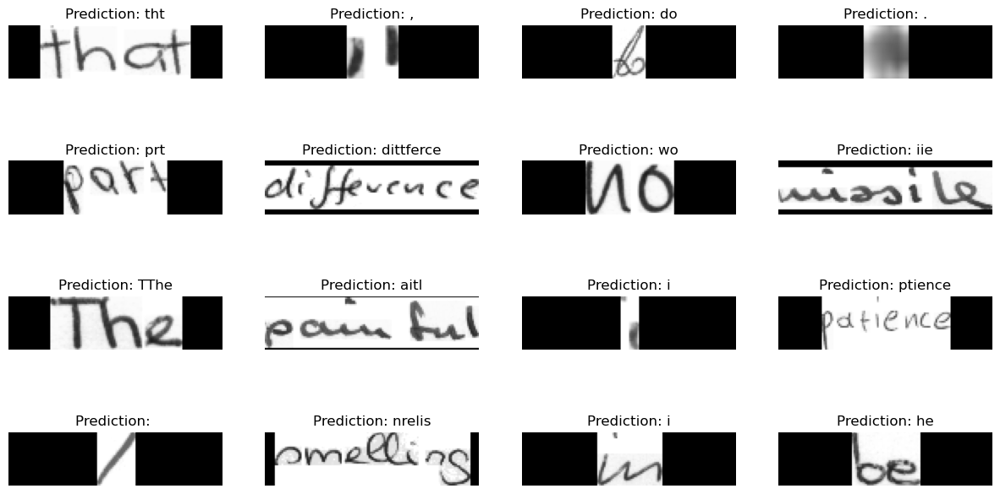

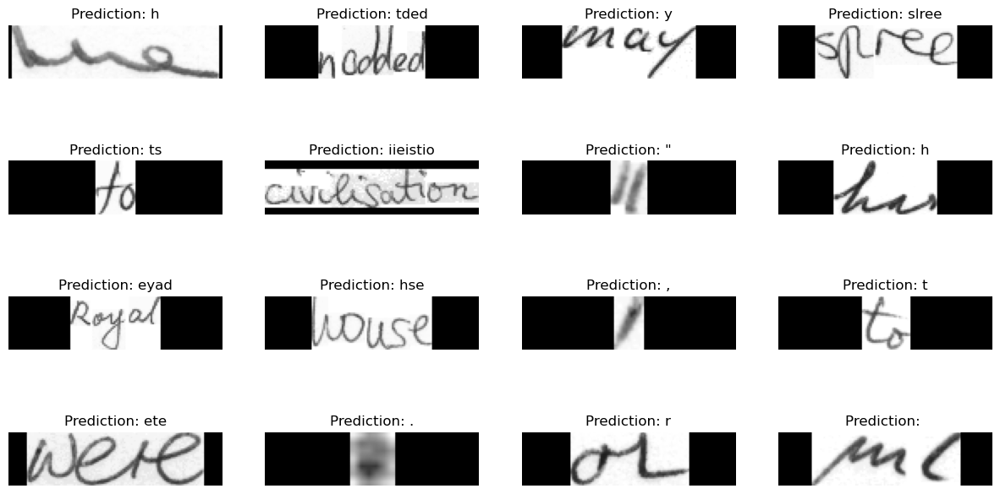

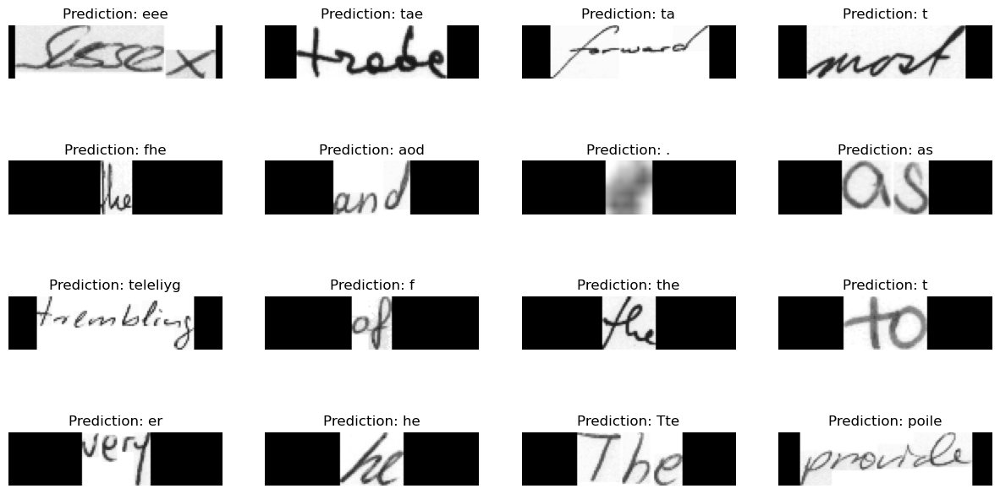

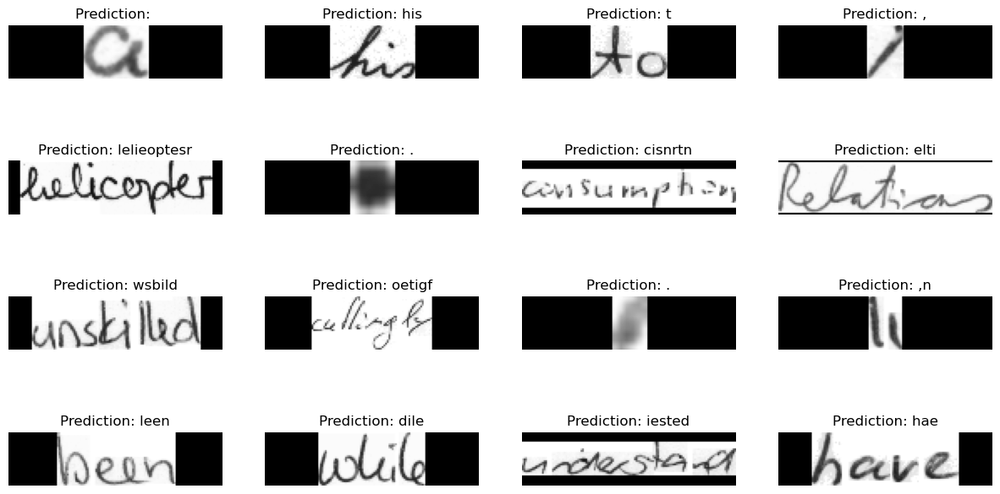

...

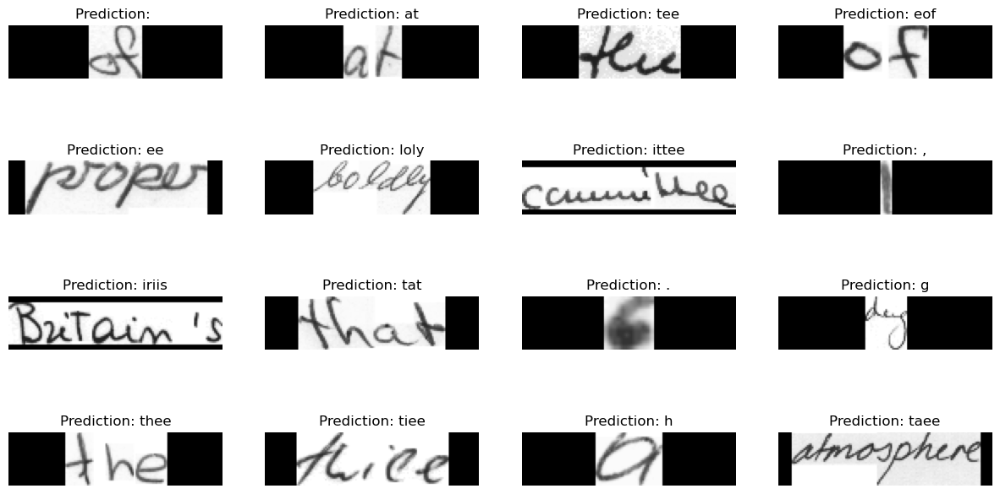

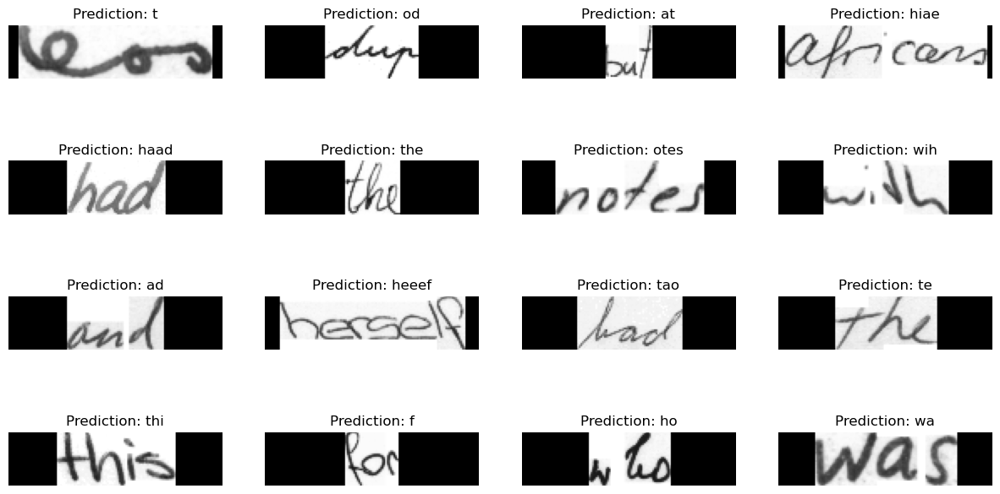

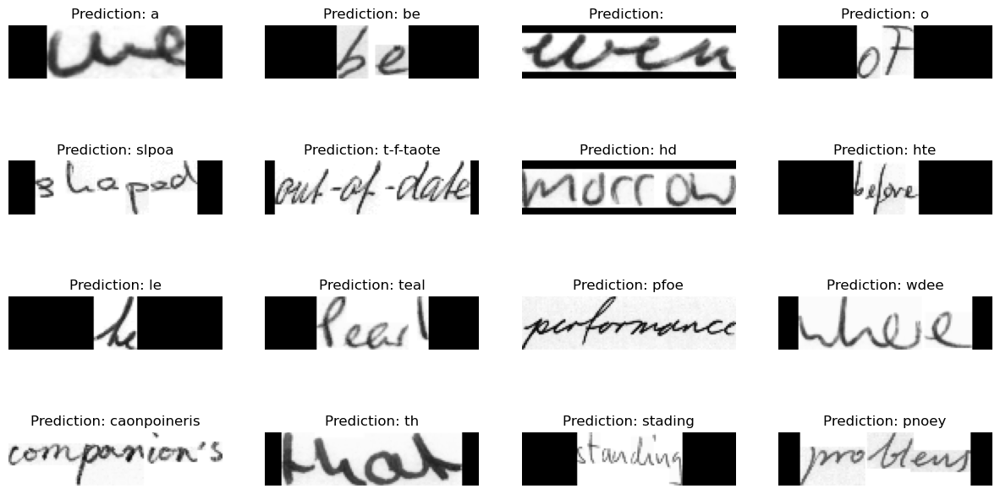

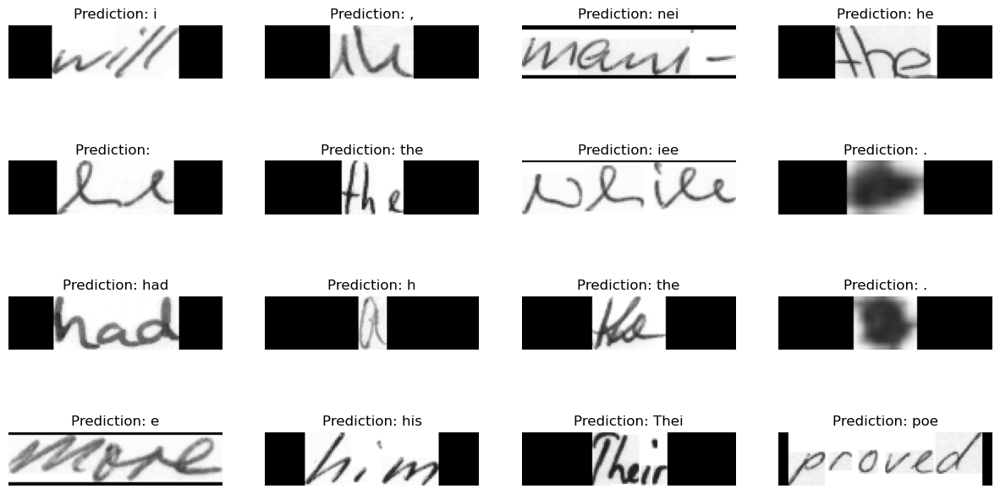

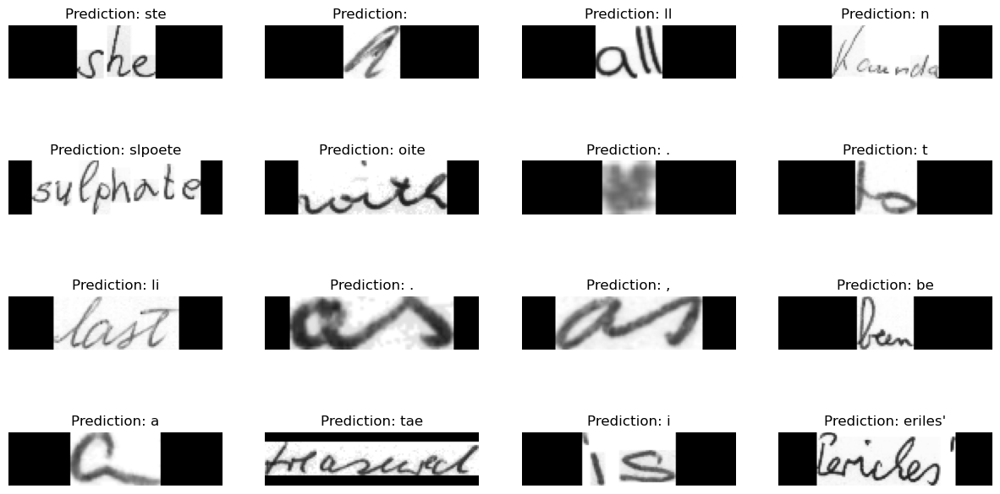

In [25]:
# A utility function to decode the output of the network.
def decode_batch_predictions(pred):
    input_len = np.ones(pred.shape[0]) * pred.shape[1]
    # Use greedy search. For complex tasks, you can use beam search.
    results = keras.backend.ctc_decode(pred, input_length=input_len, greedy=True)[0][0][
        :, :max_len
    ]
    # Iterate over the results and get back the text.
    output_text = []
    for res in results:
        res = tf.gather(res, tf.where(tf.math.not_equal(res, -1)))
        res = tf.strings.reduce_join(num_to_char(res)).numpy().decode("utf-8")
        output_text.append(res)
    return output_text


#  Let's check results on some test samples.
for batch in test_ds:
    batch_images = batch["image"]
    _, ax = plt.subplots(4, 4, figsize=(15, 8))

    preds = prediction_model.predict(batch_images)
    pred_texts = decode_batch_predictions(preds)

    for i in range(16):
        img = batch_images[i]
        img = tf.image.flip_left_right(img)
        img = tf.transpose(img, perm=[1, 0, 2])
        img = (img * 255.0).numpy().clip(0, 255).astype(np.uint8)
        img = img[:, :, 0]

        title = f"Prediction: {pred_texts[i]}"
        ax[i // 4, i % 4].imshow(img, cmap="gray")
        ax[i // 4, i % 4].set_title(title)
        ax[i // 4, i % 4].axis("off")

plt.show()

## Final remarks

* The `prediction_model` is fully compatible with TensorFlow Lite. If you are interested,
you can use it inside a mobile application. You may find
[this notebook](https://github.com/tulasiram58827/ocr_tflite/blob/main/colabs/captcha_ocr_tflite.ipynb)
to be useful in this regard.
* Not all the training examples are perfectly aligned as observed in this example. This
can hurt model performance for complex sequences. To this end, we can leverage
Spatial Transformer Networks ([Jaderberg et al.](https://arxiv.org/abs/1506.02025))
that can help the model learn affine transformations that maximize its performance.

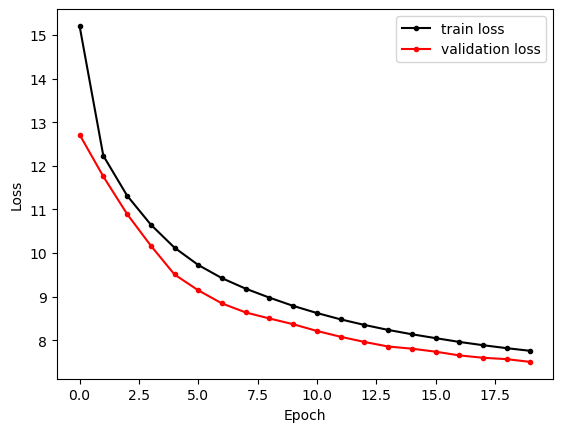

Final train loss: 7.757244110107422
Final weights: []


In [14]:
import pandas as pd
plot_loss(model, history)

In [15]:
y_pred = decode_batch_predictions(preds)

In [16]:
from sklearn.metrics import classification_report
print(classification_report(test_labels_cleaned[:64], y_pred))

               precision    recall  f1-score   support

                    0.00      0.00      0.00         0
            '       0.00      0.00      0.00         1
            ,       0.75      1.00      0.86         3
          ,es       0.00      0.00      0.00         0
            .       1.00      1.00      1.00         1
           AT       0.00      0.00      0.00         1
          And       0.00      0.00      0.00         1
       Dennis       0.00      0.00      0.00         1
        Green       0.00      0.00      0.00         1
           He       0.00      0.00      0.00         1
         Here       0.00      0.00      0.00         1
           It       0.00      0.00      0.00         1
           My       0.00      0.00      0.00         1
          The       0.00      0.00      0.00         1
       Thetan       0.00      0.00      0.00         1
       United       0.00      0.00      0.00         1
            a       0.00      0.00      0.00         1
        a

/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg

In [18]:
len(test_labels_cleaned), len(y_pred)
test_ds

<PrefetchDataset element_spec={'image': TensorSpec(shape=(None, None, None, 1), dtype=tf.float32, name=None), 'label': TensorSpec(shape=(None, None), dtype=tf.int64, name=None)}>

In [19]:
preds = prediction_model.predict(test_ds)
pred_texts = decode_batch_predictions(preds)
pred_texts

 7/76 [=>............................] - ETA: 0s 

/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/keras/engine/functional.py:566: UserWarning: Input dict contained keys ['label'] which did not match any model input. They will be ignored by the model.
  inputs = self._flatten_to_reference_inputs(inputs)
2022-10-11 15:26:47.889076: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


76/76 [==============================] - 1s 9ms/step


['alteeey',
 'tdee',
 ',',
 'the',
 'lt',
 'b',
 'edgoe',
 'lh',
 'ptio',
 'cetead',
 'oettieeis',
 'tf',
 't',
 'eted',
 ',',
 'rn',
 'ispointion',
 '.',
 'de',
 'irrithe',
 'he',
 'eehr',
 'to',
 'flig',
 ',',
 'd',
 'otf',
 'opeead',
 'leta',
 'of',
 'is',
 'itaeees',
 '',
 'teo',
 'h',
 'weehedcyge',
 'y',
 '',
 ',es',
 'ill',
 'h',
 't',
 'eei',
 'aealt',
 'he',
 'to',
 'at',
 'i',
 's',
 'ot',
 'lie',
 '',
 'ited',
 'deiots',
 'of',
 'tt',
 'led',
 'n',
 ',',
 'to',
 't',
 'the',
 'her',
 'alhlgt',
 'tht',
 ',',
 'do',
 '.',
 'prt',
 'dittferce',
 'wo',
 'iie',
 'TThe',
 'aitl',
 'i',
 'ptience',
 '',
 'nrelis',
 'i',
 'he',
 'wa',
 '',
 'iie',
 'hose',
 'itais',
 'bai',
 'is',
 ',',
 '',
 'ios',
 'tt',
 'wirid',
 'thosaal',
 'f',
 '.',
 'dete',
 'epressie',
 'patied',
 'wsitinog',
 'hich',
 'oppld',
 'hdehdh',
 'trh',
 't',
 'tteose',
 'feiro',
 'e',
 'it',
 'the',
 'adiniel',
 'tta',
 'nas',
 'sre',
 'aeess',
 '.',
 'ild',
 'bo',
 'etae',
 'Pyo',
 'te',
 'for',
 'tf',
 'tet',
 

In [20]:
len(pred_texts)

4823

In [24]:
print(classification_report(test_labels_cleaned, pred_texts))

                  precision    recall  f1-score   support

                       0.00      0.00      0.00         0
               !       1.00      0.36      0.53        11
              !e       0.00      0.00      0.00         0
               "       0.57      0.24      0.33        51
              "a       0.00      0.00      0.00         0
              "n       0.00      0.00      0.00         0
              "s       0.00      0.00      0.00         0
               #       0.00      0.00      0.00         1
               &       0.00      0.00      0.00         1
               '       0.00      0.00      0.00        15
             'ay       0.00      0.00      0.00         0
              'd       0.00      0.00      0.00         1
              'm       0.00      0.00      0.00         4
             're       0.00      0.00      0.00         1
              's       1.00      0.50      0.67         2
              't       0.00      0.00      0.00         0
             

/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/mrsca/opt/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg